In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

%matplotlib inline

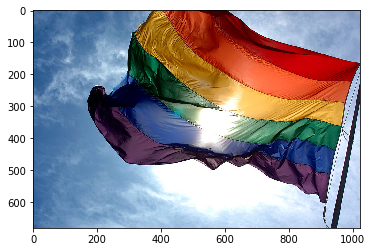

In [2]:
image = cv2.imread("images/rainbow_flag.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)

(0, 681)

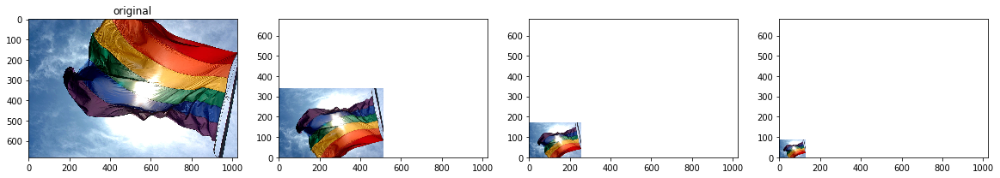

In [3]:
level_1 = cv2.pyrDown(image)
level_2 = cv2.pyrDown(level_1)
level_3 = cv2.pyrDown(level_2)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 10))

ax1.set_title('original')
ax1.imshow(image)

ax2.imshow(level_1)
ax2.set_xlim([0, image.shape[1]])
ax2.set_ylim([0, image.shape[0]])

ax3.imshow(level_2)
ax3.set_xlim([0, image.shape[1]])
ax3.set_ylim([0, image.shape[0]])

ax4.imshow(level_3)
ax4.set_xlim([0, image.shape[1]])
ax4.set_ylim([0, image.shape[0]])

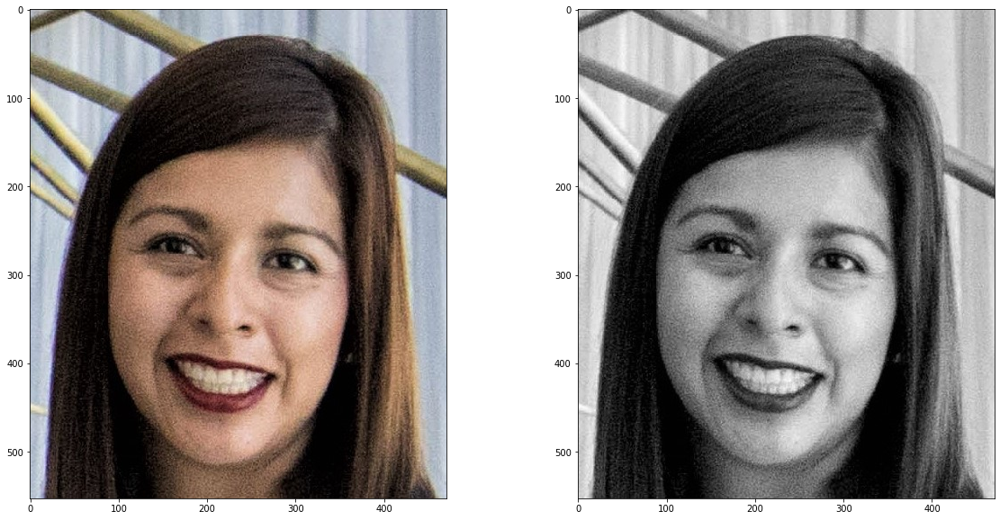

In [4]:
plt.rcParams['figure.figsize'] = [20, 10]
image = cv2.imread('./images/face.jpeg')

training_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
training_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.subplot(121)
plt.imshow(training_image)
plt.subplot(122)
plt.imshow(training_gray, cmap='gray')

In [5]:
import copy
plt.rcParams['figure.figsize'] = [14.0, 7.0]
orb = cv2.ORB_create(200, 2.0)

keypoints, descriptor = orb.detectAndCompute(training_gray, None)
keyp_without_size = copy.copy(training_image)
keyp_with_size = copy.copy(training_image)

175


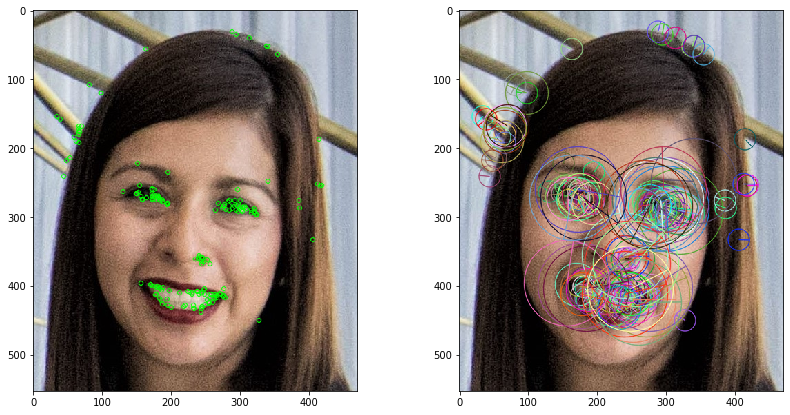

In [6]:
cv2.drawKeypoints(training_image, keypoints, keyp_without_size, color=(0, 255, 0))

cv2.drawKeypoints(training_image, keypoints, keyp_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.subplot(121)
plt.imshow(keyp_without_size)

plt.subplot(122)
plt.imshow(keyp_with_size)

print(len(keypoints))

In [9]:
import cv2

plt.rcParams['figure.figsize'] = [14.0, 7.0]
image1 = cv2.imread('images/face.jpeg')

training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
query_image = np.copy(training_image)

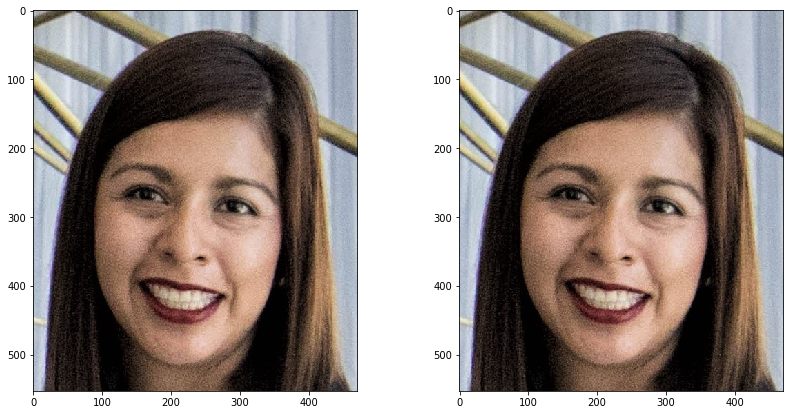

In [10]:
plt.subplot(121)
plt.imshow(training_image)
plt.subplot(122)
plt.imshow(query_image)
plt.show()

819 819
819


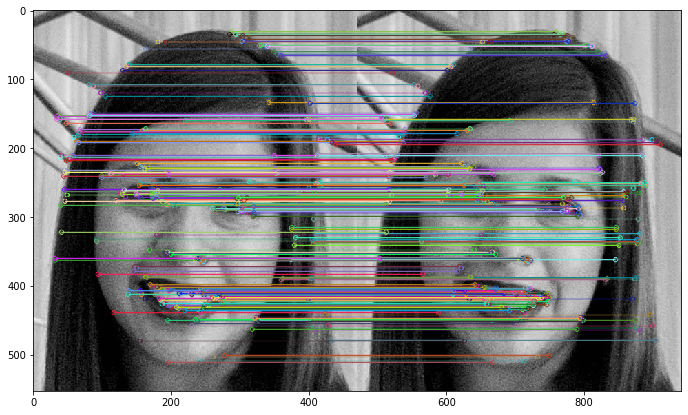

In [23]:
training_gray = cv2.cvtColor(training_image, cv2.COLOR_RGB2GRAY)
query_gray = cv2.cvtColor(query_image, cv2.COLOR_RGB2GRAY)

orb = cv2.ORB_create(1000, 2.0)
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptor_query = orb.detectAndCompute(query_gray, None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(descriptors_train, descriptor_query)

matches = sorted(matches, key = lambda x: x.distance)
result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], outImg = query_gray, flags = 2)
plt.imshow(result)
print(len(keypoints_train), len(keypoints_query))
print(len(matches))

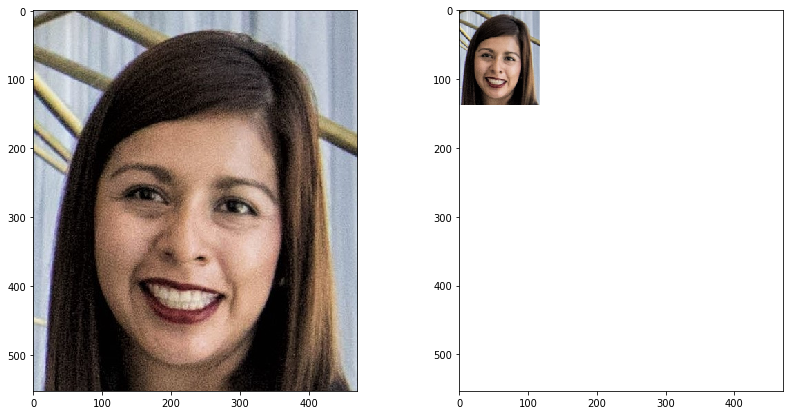

In [33]:
image2 = cv2.imread('images/faceQS.png')
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
plt.subplot(121)
plt.imshow(training_image)
ax2 = plt.subplot(122)
ax2.imshow(query_image)

ax2.set_xlim(0, training_image.shape[1])
ax2.set_ylim(training_image.shape[0], 0)

plt.show()

#keyponits of training_image is 821, 
and #keypoints of query_image is 65.
58


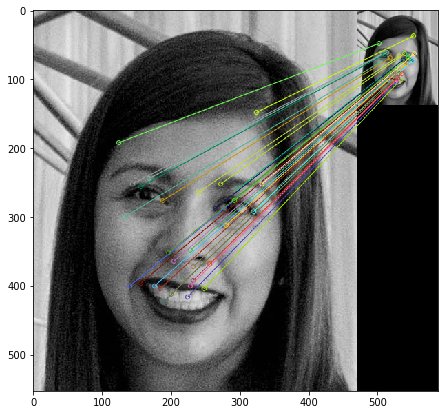

In [36]:
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

orb = cv2.ORB_create(1000, 2.0)
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

#Brute Force
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
matches = bf.match(descriptors_train, descriptors_query)
matches = sorted(matches, key = lambda x: x.distance)

result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:30], query_gray, flags = 2)
plt.imshow(result)

print("#keyponits of training_image is {}, \nand #keypoints of query_image is {}.".format(len(keypoints_train), len(keypoints_query)))
print(len(matches))


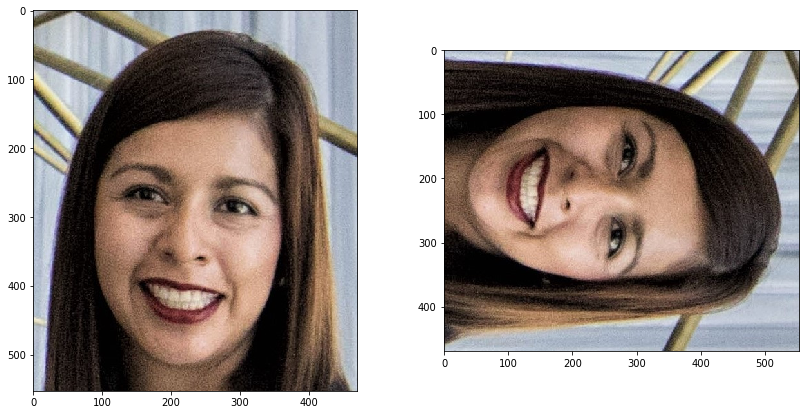

In [37]:
image2 = cv2.imread('images/faceR.jpeg')
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
plt.subplot(121)
plt.imshow(training_image)
plt.subplot(122)
plt.imshow(query_image)
plt.show()

In [39]:
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

orb = cv2.ORB_create(1000, 2.0)
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_image, None)

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(descriptors_train, descriptors_query)
matches = sorted(matches, key = lambda x : x.distance)
result = cv2.drawMatches(training_gray, 
                         keypoints_train, 
                         query_gray, 
                         keypoints_query, 
                         matches[:100], 
                         query_gray, 
                         flags = 2)

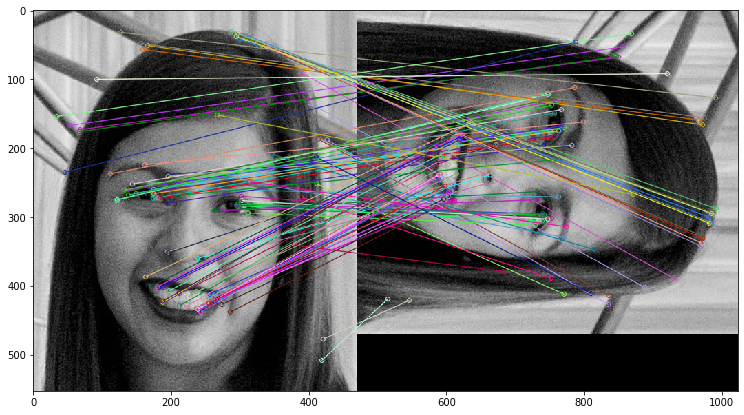

#keyponits of training_image is 821, 
and #keypoints of query_image is 832.
# of matches is 617


In [41]:
plt.imshow(result)
plt.show()
print("#keyponits of training_image is {}, \nand #keypoints of query_image is {}.".format(len(keypoints_train), len(keypoints_query)))
print("# of matches is {}".format(len(matches)))

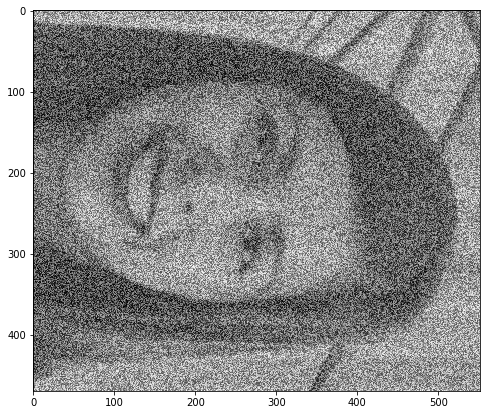

In [44]:
image2 = cv2.imread('images/faceRN5.png')
query_gray = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

plt.imshow(query_gray, cmap='gray')

In [48]:
def orb_match(training_gray, query_gray):
    orb = cv2.ORB_create(1000, 1.3)
    keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
    keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
    matches = bf.match(descriptors_train, descriptors_query)
    matches = sorted(matches, key = lambda x : x.distance)

    result = cv2.drawMatches(training_gray,
                            keypoints_train,
                            query_gray,
                            keypoints_query,
                            matches[:100],
                            query_gray, flags=2)
    plt.imshow(result)
    print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))
    # Print the number of keypoints detected in the query image
    print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))
    # Print total number of matching points between the training and query images
    print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

Number of Keypoints Detected In The Training Image:  888
Number of Keypoints Detected In The Query Image:  925

Number of Matching Keypoints Between The Training and Query Images:  251


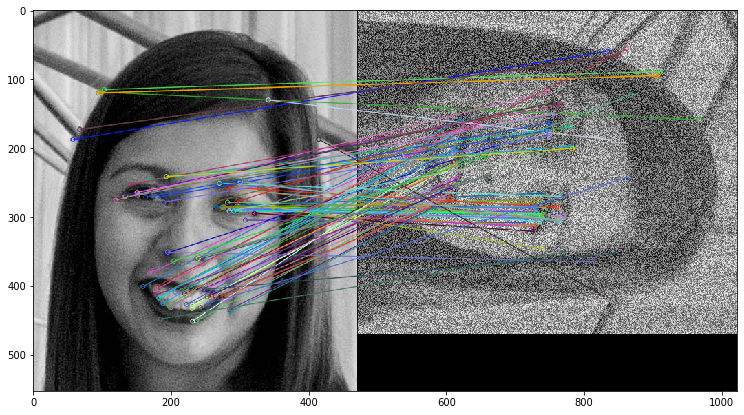

In [49]:
orb_match(training_gray, query_gray)

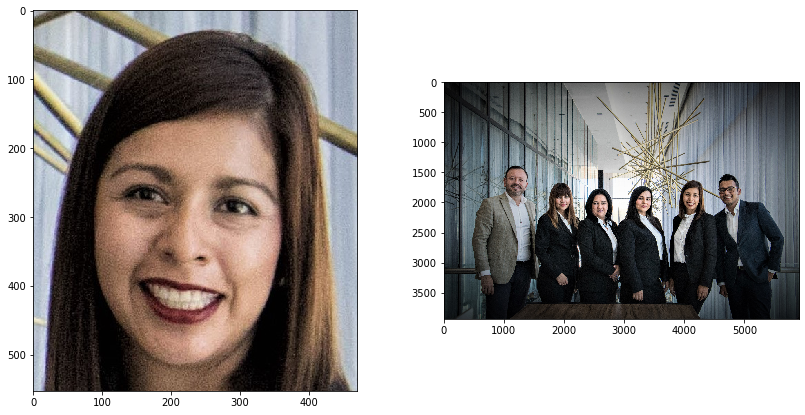

In [50]:
image2 = cv2.imread('images/Team.jpeg')
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
plt.subplot(121)
plt.imshow(training_image)
plt.subplot(122)
plt.imshow(query_image)


4941


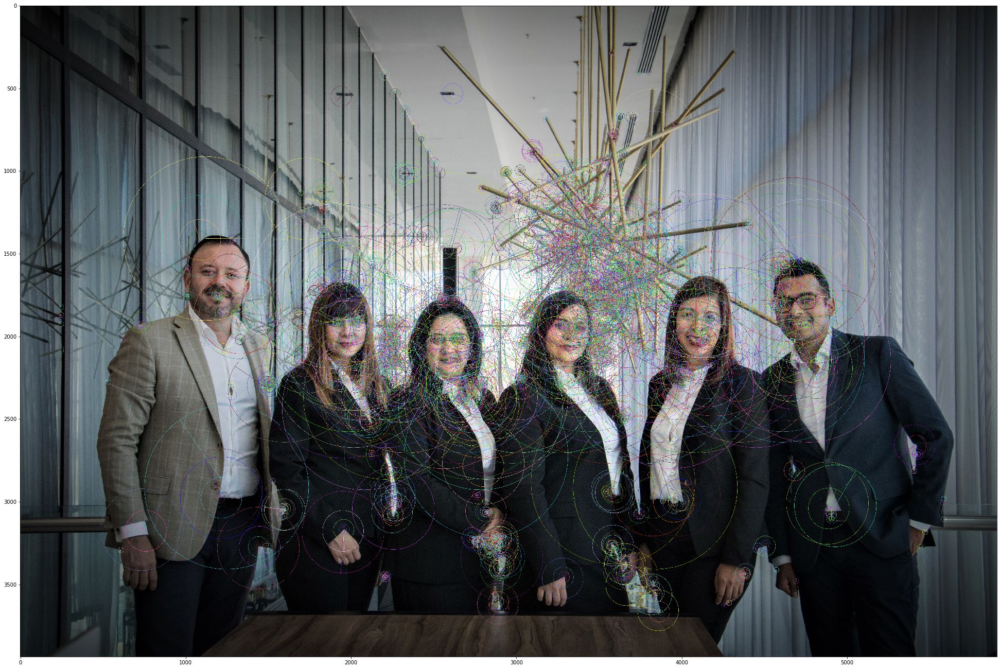

In [52]:
plt.rcParams['figure.figsize'] = [34.0, 34.0]
training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

orb = cv2.ORB_create(5000, 2.0)
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

query_img_keyp = copy.copy(query_image)
cv2.drawKeypoints(query_image, keypoints_query, query_img_keyp, 
                  flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(query_img_keyp)
print(len(keypoints_query))

Number of Keypoints Detected In The Training Image:  2488
Number of Keypoints Detected In The Query Image:  4941

Number of Matching Keypoints Between The Training and Query Images:  667


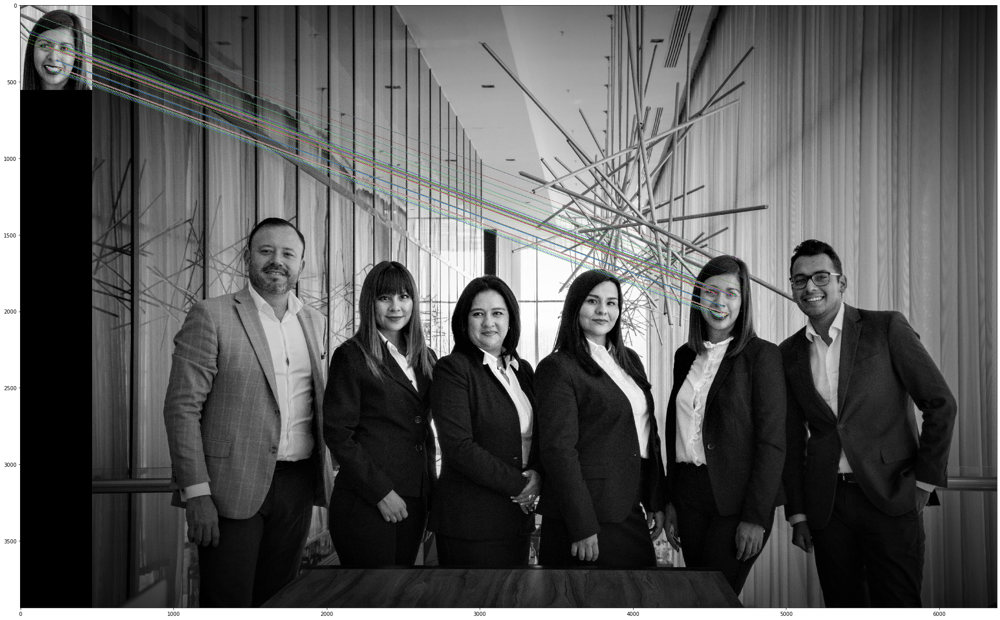

In [54]:
plt.rcParams['figure.figsize'] = [34.0, 34.0]

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
matches = bf.match(descriptors_train, descriptors_query)
matches = sorted(matches, key = lambda x: x.distance)

result = cv2.drawMatches(training_gray, 
                        keypoints_train,
                        query_gray, 
                        keypoints_query,
                        matches[:85],
                        query_gray,
                        flags = 2)
plt.imshow(result)
# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

# Print total number of matching Keypoints between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))